In [370]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import umap.umap_ as umap
import matplotlib.pyplot as plt


In [371]:
r1_r2_annotations_df = pd.read_excel('data/r1_r2_annotations_liwc_h.xlsx')
r1_r2_annotations_df = r1_r2_annotations_df[r1_r2_annotations_df['majority_vote'] != 'NoMajority']
print(len(r1_r2_annotations_df))
target = r1_r2_annotations_df['majority_vote']
df_tweet = r1_r2_annotations_df['proc_text']
r1_r2_annotations_df.drop(["A1","A2","A3","A4","A5","A6","majority_vote",'text','proc_text','roundID'], axis=1, inplace=True)

353


In [372]:
def try_kmeans(df):
    num_random_states = 5
    max_score = 0

    for i in range(3, 10):
        silhouette_scores = []

        for _ in range(num_random_states):
            random_state = np.random.randint(1000)
            kmeans = KMeans(n_clusters=i, random_state=random_state,)
            clusters = kmeans.fit_predict(df)

            # Calculating silhouette score to evaluate clustering effectiveness
            silhouette_avg = silhouette_score(df, clusters)
            silhouette_scores.append(silhouette_avg)
        avg_silhouette_score = np.mean(silhouette_scores)

        if avg_silhouette_score > max_score:
            max_score = avg_silhouette_score
            best_n_clusters = i
            best_clusters = kmeans.fit_predict(df)


        print(f'Average Silhouette Score with {i} groups: {avg_silhouette_score:.2f} {list(map(lambda x: round(x,2),silhouette_scores))}')
    print(f'Best number of clusters: {best_n_clusters} with Silhouette Score: {max_score:.2f}')
    return best_clusters

In [373]:
# Reducing the dimensionality for visualization
def plot_clusters(df,clusters,title=""):
    pca = PCA(n_components=3)
    df_red = pca.fit_transform(df)

    # Plotting the clusters in 3D using matplotlib
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot
    scatter = ax.scatter(df_red[:, 0], df_red[:, 1], df_red[:, 2],
                        c=clusters, cmap='viridis', label=clusters)

    # Legend
    legend1 = ax.legend(*scatter.legend_elements(),
                        loc="upper right", title="Clusters")
    ax.add_artist(legend1)

    # Labels
    ax.set_xlabel('Component 1')
    ax.set_ylabel('Component 2')
    ax.set_zlabel('Component 3')
    ax.set_title('3D Clusters Visualization'+title)

    plt.savefig('3d_clusters_visualization.png')
    plt.show()
    print('3D clusters visualization saved as 3d_clusters_visualization.png')

In [374]:
import seaborn as sns

def plot_cluster_distribution(df, clusters, target):
    # Merge the clusters and target columns into a single dataframe
    df_clusters = pd.DataFrame({'Cluster': clusters, 'majority_vote': target})

    # Plot the distribution of each target in each cluster
    plt.figure(figsize=(10, 7))
    sns.countplot(x='Cluster', hue='majority_vote', data=df_clusters, palette='coolwarm')
    plt.title('Distribution of Target in Clusters')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    plt.legend(title='Target')
    plt.show()


In [375]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

pca = PCA(n_components=50)
red_df = pca.fit_transform(r1_r2_annotations_df)

clusters = try_kmeans(red_df)

Average Silhouette Score with 3 groups: 0.19 [0.19, 0.18, 0.19, 0.22, 0.18]
Average Silhouette Score with 4 groups: 0.19 [0.19, 0.2, 0.19, 0.19, 0.19]
Average Silhouette Score with 5 groups: 0.19 [0.2, 0.2, 0.2, 0.17, 0.2]
Average Silhouette Score with 6 groups: 0.18 [0.19, 0.18, 0.19, 0.18, 0.19]
Average Silhouette Score with 7 groups: 0.17 [0.16, 0.18, 0.19, 0.17, 0.17]
Average Silhouette Score with 8 groups: 0.16 [0.15, 0.15, 0.14, 0.17, 0.17]
Average Silhouette Score with 9 groups: 0.15 [0.16, 0.16, 0.15, 0.17, 0.14]
Best number of clusters: 3 with Silhouette Score: 0.19


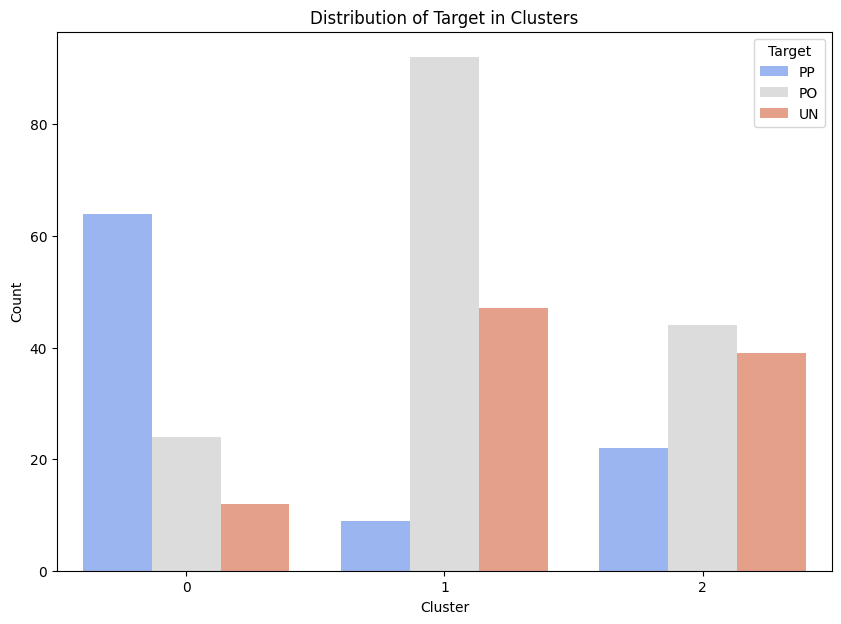

In [376]:
plot_cluster_distribution(r1_r2_annotations_df, clusters, target)

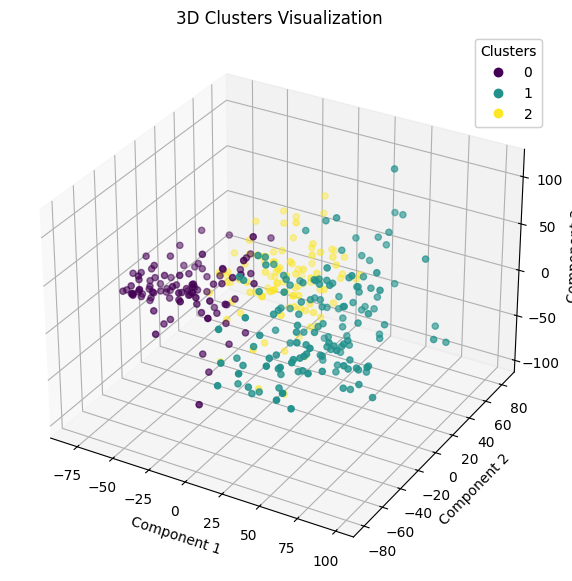

3D clusters visualization saved as 3d_clusters_visualization.png


In [377]:
plot_clusters(red_df,clusters)

In [378]:
# Excluding non-numeric columns and focusing on LIWC features for clustering
features_for_clustering = ['emo_pos', 'emo_neg', 'emo_anx', 'emo_anger', 'emo_sad', 'work', 'leisure', 'money', 'health', 'mental']
# features_for_clustering = r1_r2_annotations_df.select_dtypes(include=['float','int']).columns.values
# r1_r2_annotations_df.drop(columns=['text','proc_text','roundID'], inplace=True)

# Standardizing the numeric features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(r1_r2_annotations_df[features_for_clustering])
# features_scaled = scaler.fit_transform(r1_r2_annotations_df)
df_scaled = pd.DataFrame(features_scaled, columns=features_for_clustering)
# df_scaled = pd.DataFrame(features_scaled, columns=r1_r2_annotations_df.columns.values)

best_clusters = try_kmeans(df_scaled)

Average Silhouette Score with 3 groups: 0.25 [0.27, 0.27, 0.27, 0.24, 0.2]
Average Silhouette Score with 4 groups: 0.21 [0.19, 0.22, 0.2, 0.21, 0.21]
Average Silhouette Score with 5 groups: 0.23 [0.28, 0.21, 0.19, 0.2, 0.26]
Average Silhouette Score with 6 groups: 0.22 [0.23, 0.25, 0.24, 0.22, 0.16]
Average Silhouette Score with 7 groups: 0.18 [0.17, 0.21, 0.15, 0.2, 0.18]
Average Silhouette Score with 8 groups: 0.20 [0.24, 0.17, 0.19, 0.19, 0.19]
Average Silhouette Score with 9 groups: 0.21 [0.21, 0.22, 0.19, 0.24, 0.2]
Best number of clusters: 3 with Silhouette Score: 0.25


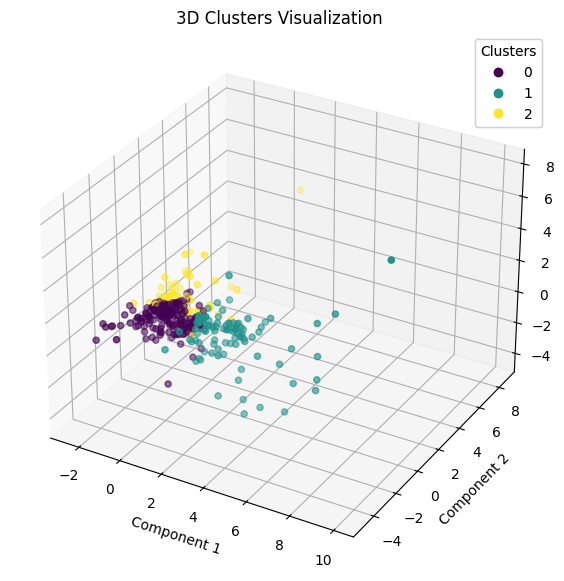

3D clusters visualization saved as 3d_clusters_visualization.png


In [379]:
plot_clusters(df_scaled,best_clusters)

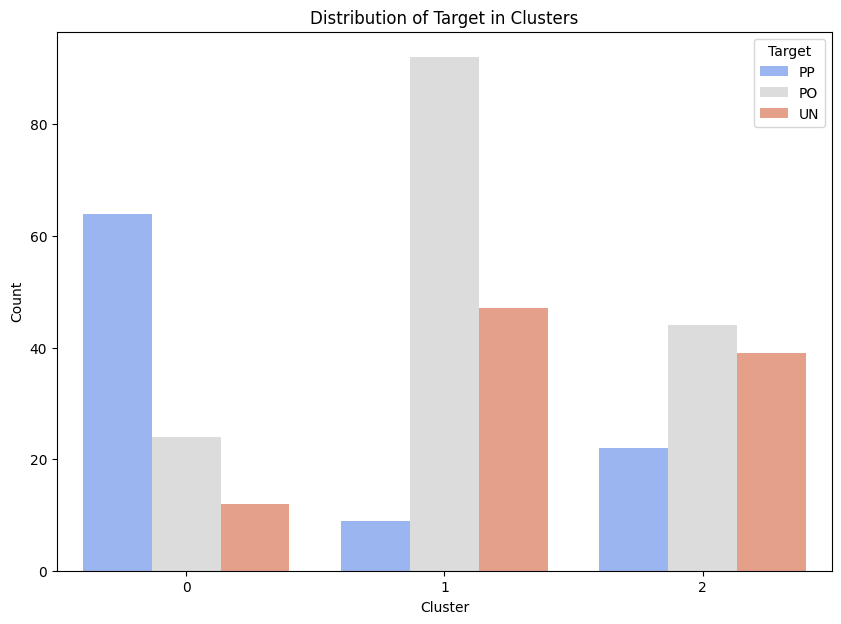

In [380]:
plot_cluster_distribution(r1_r2_annotations_df, clusters, target)

In [381]:
# Preprocess the text data
vectorizer = TfidfVectorizer()
text_features = vectorizer.fit_transform(df_tweet)

# Reduce dimensions using UMAP
umap_model = umap.UMAP(n_components=50)
text_features_red = umap_model.fit_transform(text_features)

clusters = try_kmeans(text_features_red)

Average Silhouette Score with 3 groups: 0.29 [0.3, 0.3, 0.3, 0.3, 0.29]
Average Silhouette Score with 4 groups: 0.30 [0.31, 0.31, 0.26, 0.3, 0.31]
Average Silhouette Score with 5 groups: 0.29 [0.28, 0.28, 0.31, 0.29, 0.28]
Average Silhouette Score with 6 groups: 0.29 [0.29, 0.28, 0.29, 0.3, 0.29]
Average Silhouette Score with 7 groups: 0.26 [0.26, 0.28, 0.24, 0.24, 0.27]
Average Silhouette Score with 8 groups: 0.27 [0.28, 0.24, 0.29, 0.27, 0.27]
Average Silhouette Score with 9 groups: 0.28 [0.29, 0.29, 0.28, 0.31, 0.24]
Best number of clusters: 4 with Silhouette Score: 0.30


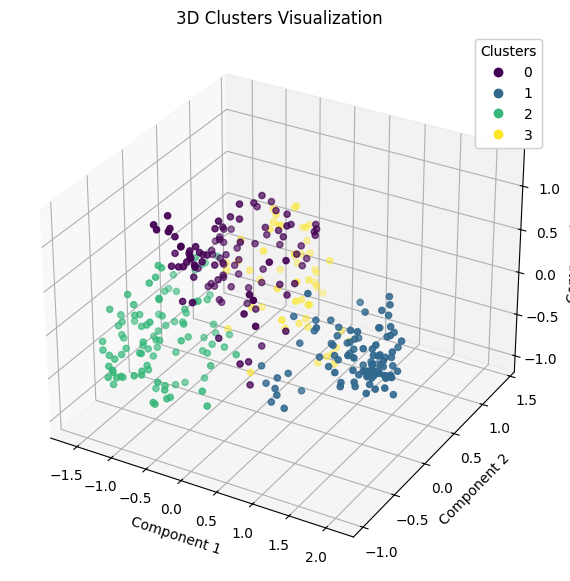

3D clusters visualization saved as 3d_clusters_visualization.png


In [382]:
plot_clusters(text_features_red,clusters)

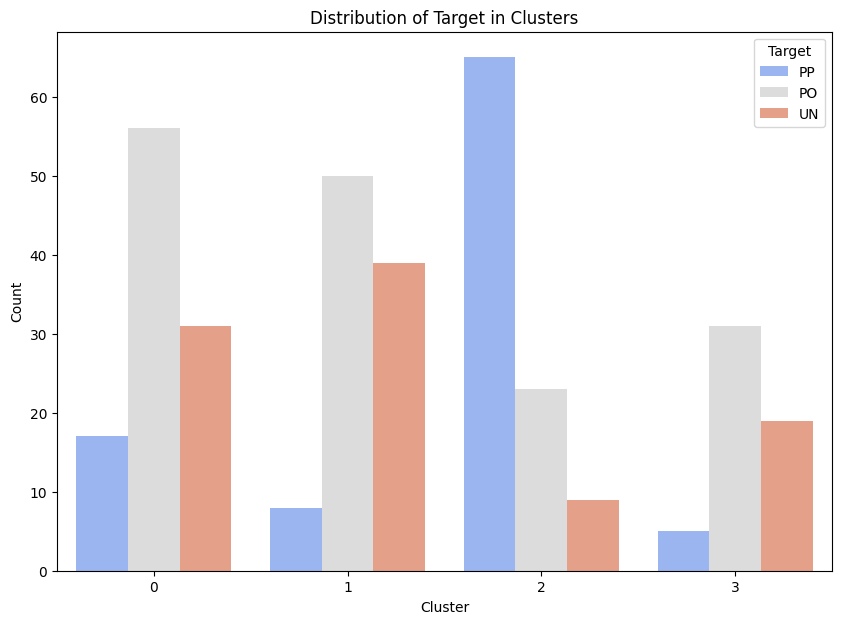

In [383]:
plot_cluster_distribution(df_tweet, clusters, target)

In [384]:
from babyplots import Babyplot

# Reduce dimensions using UMAP
umap1 = umap.UMAP(n_components=3)
feat_red2 = umap1.fit_transform(text_features)

bp = Babyplot(background_color="#ffffddff")
bp.add_plot(feat_red2, "pointCloud", color_var=clusters, color_by="categories", options={'size':4,'shape':'sphere','colorScale':'viridis'})
bp

<IPython.core.display.Javascript object>

<style>
canvas#cd7a77eb_d72e_4645_bfd2_46d27dc2d84d {
  width: 640px;
  height: 480px;
  background-color: #ffffddff
}
</style>

<canvas width="640" height="480" id="plot_cd7a77eb_d72e_4645_bfd2_46d27dc2d84d"></canvas>


<script>
  require(['Baby'], function(Baby) {
    function display_cd7a77eb_d72e_4645_bfd2_46d27dc2d84d() {
        var vis = new Baby.Plots("plot_cd7a77eb_d72e_4645_bfd2_46d27dc2d84d", {
          backgroundColor: "#ffffddff",
          turntable: false,
          rotationRate: 0.01,
          xScale: 1,
          yScale: 1,
          zScale: 1,
          shapeLegendTitle: "",
          upAxis: false
        });
        vis.Python = true;
        
          
            var coords = [[0.9599912166595459, 11.040937423706055, -0.5963298678398132], [0.42860546708106995, 11.584301948547363, -0.6388782262802124], [1.1936943531036377, 10.222400665283203, 0.4195912182331085], [0.8507349491119385, 10.950799942016602, 0.8109835386276245], [1.5935767889022827, 11.497383117675781, -0.5642837882041931], [2.1328113079071045, 9.72227668762207, -0.3055906891822815], [0.9727060198783875, 9.832551956176758, 1.067969799041748], [3.0220916271209717, 10.360000610351562, 1.1904420852661133], [0.7376067042350769, 11.096295356750488, 0.1914573758840561], [0.9468467235565186, 11.941691398620605, -0.5171562433242798], [0.7300912737846375, 11.674123764038086, -0.4315754771232605], [2.008248805999756, 9.118797302246094, 1.1059818267822266], [0.33461669087409973, 11.602132797241211, -0.4167935848236084], [1.8660719394683838, 8.255452156066895, 1.8112237453460693], [2.0678017139434814, 8.419268608093262, 1.836997389793396], [0.529437243938446, 11.247706413269043, -0.7117074131965637], [0.9788656234741211, 10.96640396118164, -1.152450680732727], [0.31602007150650024, 10.477818489074707, 0.044375691562891006], [0.6557375192642212, 10.60419750213623, -0.47051262855529785], [0.06192672997713089, 11.461257934570312, -0.12663598358631134], [0.3390860855579376, 11.6275053024292, -0.4418749213218689], [2.437251329421997, 9.517048835754395, 0.9362002015113831], [1.8131601810455322, 11.751559257507324, -0.11295946687459946], [1.1053084135055542, 11.861918449401855, 0.32099729776382446], [1.309451699256897, 11.417738914489746, 1.6271369457244873], [2.6012144088745117, 8.86280632019043, 1.171923041343689], [1.4611948728561401, 11.111457824707031, -0.866237998008728], [2.3365402221679688, 10.099748611450195, 0.040170419961214066], [0.03229927271604538, 11.274630546569824, 0.5902515649795532], [1.3206642866134644, 10.72431468963623, -0.9049714803695679], [0.06391723453998566, 10.100184440612793, 0.11587119102478027], [2.03832745552063, 10.137380599975586, 1.109131097793579], [1.2347996234893799, 10.990909576416016, 0.2675217092037201], [0.2818143665790558, 10.325298309326172, -0.2666682302951813], [0.30005767941474915, 10.342436790466309, 1.4507771730422974], [2.267390012741089, 8.46630859375, 2.2796080112457275], [0.8344135284423828, 11.070091247558594, -0.2421647012233734], [1.8356436491012573, 11.926490783691406, 0.15748879313468933], [1.0490474700927734, 11.098224639892578, -0.17791643738746643], [1.234682559967041, 11.272208213806152, 0.3869786560535431], [1.741127610206604, 10.377425193786621, 0.906314492225647], [0.30459100008010864, 11.750515937805176, -0.3192625045776367], [1.4572750329971313, 10.830497741699219, -0.3522682189941406], [0.483429491519928, 9.77249813079834, 0.5051783919334412], [-0.33796924352645874, 9.874672889709473, 0.10641143471002579], [1.2009367942810059, 12.001511573791504, 0.24091865122318268], [2.1079368591308594, 8.416028022766113, 1.1770039796829224], [2.9851651191711426, 10.362809181213379, 1.181445598602295], [0.7462010979652405, 11.929463386535645, -0.07285710424184799], [1.1606104373931885, 11.606003761291504, 0.4646883010864258], [0.8133995532989502, 11.378180503845215, -0.8258320689201355], [0.6525402665138245, 9.893767356872559, 1.0742425918579102], [0.572532594203949, 12.058379173278809, -0.12535293400287628]

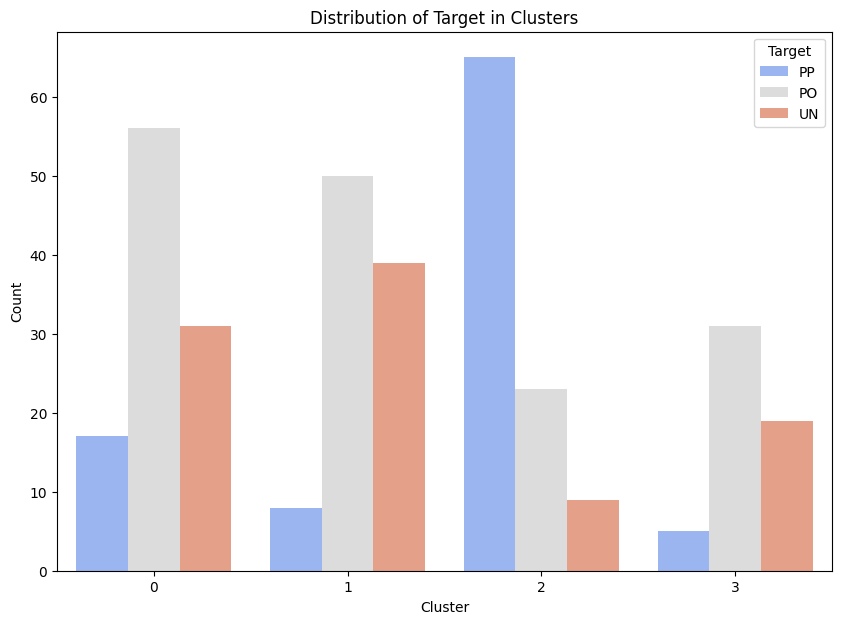

In [385]:
plot_cluster_distribution(text_features, clusters, target)

In [386]:
from sklearn.manifold import TSNE

# Reduce dimensions using UMAP
tsne = TSNE(n_components=3, init='random')
feat_red2 = tsne.fit_transform(text_features)

bp = Babyplot(background_color="#ffffddff")
bp.add_plot(feat_red2, "pointCloud", color_var=clusters, color_by="categories", options={'size':4,'shape':'sphere','colorScale':'viridis'})
bp

<IPython.core.display.Javascript object>

<style>
canvas#1a5a1d7f_7046_49ee_9f9d_79ba077c323c {
  width: 640px;
  height: 480px;
  background-color: #ffffddff
}
</style>

<canvas width="640" height="480" id="plot_1a5a1d7f_7046_49ee_9f9d_79ba077c323c"></canvas>


<script>
  require(['Baby'], function(Baby) {
    function display_1a5a1d7f_7046_49ee_9f9d_79ba077c323c() {
        var vis = new Baby.Plots("plot_1a5a1d7f_7046_49ee_9f9d_79ba077c323c", {
          backgroundColor: "#ffffddff",
          turntable: false,
          rotationRate: 0.01,
          xScale: 1,
          yScale: 1,
          zScale: 1,
          shapeLegendTitle: "",
          upAxis: false
        });
        vis.Python = true;
        
          
            var coords = [[-12.889897346496582, 16.67462730407715, 3.414384603500366], [-19.371307373046875, 52.83579635620117, -41.98054885864258], [23.225460052490234, 7.778881549835205, -19.073898315429688], [-77.68795013427734, -29.221643447875977, -1.795596718788147], [-43.07313919067383, 15.901331901550293, -19.124021530151367], [44.39133071899414, 10.099642753601074, -26.658140182495117], [5.211954116821289, -59.305946350097656, 22.328933715820312], [77.08500671386719, -10.753334045410156, -10.373537063598633], [-12.416799545288086, -40.450252532958984, 21.93143653869629], [54.994483947753906, 37.94680404663086, -15.911808967590332], [-44.35636520385742, 26.21257972717285, -33.21036148071289], [-31.997766494750977, 29.80754280090332, 27.551551818847656], [-26.621109008789062, 27.30744171142578, -45.000221252441406], [10.191204071044922, 15.013598442077637, 54.154502868652344], [-3.9759485721588135, 5.661739349365234, 43.34014129638672], [-15.846993446350098, 43.70906448364258, -24.367740631103516], [2.6006786823272705, 21.651086807250977, -40.72228240966797], [49.296104431152344, 34.9621467590332, -40.77852249145508], [33.42930221557617, 16.2087345123291, -49.72749328613281], [-20.96144676208496, 23.760698318481445, -28.899099349975586], [-26.426513671875, 41.760108947753906, -36.65778732299805], [8.417465209960938, 14.349383354187012, -1.2424092292785645], [-55.97791290283203, 25.347396850585938, 31.21231460571289], [-4.553046226501465, 29.11079216003418, -71.27179718017578], [-20.255250930786133, -56.445186614990234, 19.290639877319336], [43.5168571472168, -9.410674095153809, 30.222761154174805], [-46.413631439208984, 57.3863525390625, -15.692607879638672], [10.596260070800781, -22.110074996948242, 18.08322525024414], [-61.715736389160156, 2.8781561851501465, 19.012556076049805], [-14.714704513549805, 41.092525482177734, -2.3123087882995605], [-45.03510284423828, 48.262054443359375, 2.8427958488464355], [26.694778442382812, -32.542476654052734, 27.733339309692383], [-0.07729116082191467, 52.994728088378906, 11.563709259033203], [-4.588790416717529, -15.136007308959961, -64.5483627319336], [-32.64995193481445, -43.18843460083008, -28.348379135131836], [38.54243469238281, 34.17566680908203, 14.472064018249512], [22.707931518554688, 27.894739151000977, -66.74131774902344], [-50.633262634277344, 32.289432525634766, 20.465579986572266], [27.034006118774414, 38.595985412597656, -53.76764678955078], [-65.33940887451172, -9.63830280303955, -5.977293491363525], [1.495928168296814, -36.171878814697266, -0.5218525528907776], [-27.15638542175293, 39.18968963623047, -51.73575210571289], [-10.513106346130371, 3.3692431449890137, -27.60143280029297], [-19.09174156188965, -18.16859245300293, 47.10601806640625], [-42.44970703125, 69.73687744140625, 15.89361572265625], [9.439652442932129, 60.367897033691406, -31.218751907348633], [18.601451873779297, -9.385414123535156, 74.95487213134766], [67.04349517822266, -8.922348976135254, -9.06791877746582], [-14.335588455200195, -46.955928802490234, 46.803245544433594], [5.621938705444336, 12.55905532836914, -63.574405670166016], [-40.633907318115234, -53.962711334228516, 39.66230392456055], [0.4329078793525696, -53.08891677856445, -16.717859268188477], [-36.9925537109375, 13.773579597473145, -39.65480422973633], [6.085601

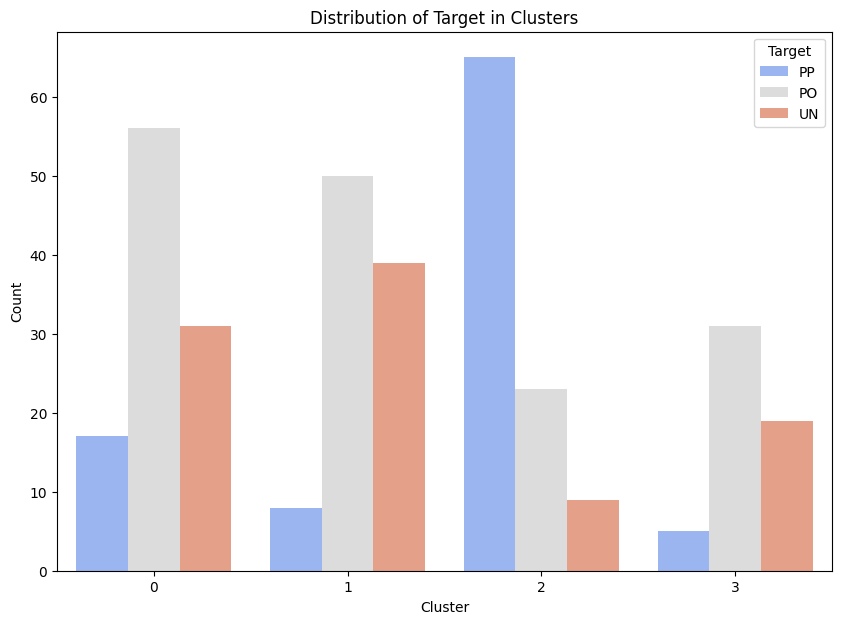

In [387]:
plot_cluster_distribution(text_features, clusters, target)

In [393]:
from sklearn.cluster import HDBSCAN


# # Reduce dimensions using UMAP
# pca = PCA(n_components=50)
# df_tweet_red1 = pca.fit_transform(text_features)

# Reduce dimensions using UMAP
tsne = TSNE(n_components=3, init='random')
df_tweet_red2 = tsne.fit_transform(text_features)

# Reduce dimensions using UMAP
umap1 = umap.UMAP(n_components=50)
df_tweet_red3 = umap1.fit_transform(text_features)

# # Cluster the data using HDBSCAN
# hdbscan = HDBSCAN(min_cluster_size=10)
# clusters = hdbscan.fit_predict(df_tweet_red1)
# print(clusters)


# Cluster the data using HDBSCAN
hdbscan = HDBSCAN(min_cluster_size=10)
clusters1 = hdbscan.fit_predict(df_tweet_red2)
print(clusters1)


# Cluster the data using HDBSCAN
hdbscan = HDBSCAN(min_cluster_size=10)
clusters2 = hdbscan.fit_predict(df_tweet_red3)
print(clusters2)




[-1 -1  1 -1  1 -1 -1 -1 -1 -1 -1 -1  1  0 -1  1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1  0 -1  1 -1  1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1  0  0 -1 -1 -1 -1  0 -1 -1 -1 -1 -1 -1  0 -1 -1 -1  1
 -1 -1 -1 -1  0  1 -1  0 -1 -1 -1  1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1  0 -1 -1  1 -1  0 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1  0 -1 -1  0 -1 -1
 -1 -1 -1  0 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0  0 -1 -1  0 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1  0 -1 -1 -1 -1 -1 -1 -1 -1 -1
  0 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1 -1  0
  0 -1 -1 -1 -1 -1 -1  0 -1  1  1 -1 -1 -1 -1  0 -1 -1  1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1  0
 -1 -1 -1 -1 -1 -1 -1 -1  0  0 -1 -1 -1 -1  0 -1 -1 -1 -1 -1 -1 -1 -1  0
 -1 -1 -1  0 -1  0 -1  0 -1 -1 -1 -1 -1 -1 -1 -1 -1

In [394]:
bp = Babyplot(background_color="#ffffddff")
bp.add_plot(df_tweet_red2, "pointCloud", color_var=clusters1, color_by="categories", options={'size':4,'shape':'sphere','colorScale':'viridis'})
bp

<IPython.core.display.Javascript object>

<style>
canvas#8622bc17_3c85_4ede_bcce_ff03e2b4bd1e {
  width: 640px;
  height: 480px;
  background-color: #ffffddff
}
</style>

<canvas width="640" height="480" id="plot_8622bc17_3c85_4ede_bcce_ff03e2b4bd1e"></canvas>


<script>
  require(['Baby'], function(Baby) {
    function display_8622bc17_3c85_4ede_bcce_ff03e2b4bd1e() {
        var vis = new Baby.Plots("plot_8622bc17_3c85_4ede_bcce_ff03e2b4bd1e", {
          backgroundColor: "#ffffddff",
          turntable: false,
          rotationRate: 0.01,
          xScale: 1,
          yScale: 1,
          zScale: 1,
          shapeLegendTitle: "",
          upAxis: false
        });
        vis.Python = true;
        
          
            var coords = [[-46.044105529785156, -3.5621471405029297, -5.478913307189941], [-33.19879913330078, 33.34126281738281, -53.568626403808594], [32.8213996887207, -6.123499393463135, -22.73006248474121], [-20.927688598632812, -58.836307525634766, -17.515384674072266], [0.17278139293193817, -0.8877789974212646, -33.5804557800293], [45.740055084228516, 5.422694206237793, -18.29734230041504], [28.940174102783203, -39.26893997192383, 7.8055243492126465], [42.654056549072266, 27.212779998779297, 11.752286911010742], [-43.13435745239258, -3.1380746364593506, 12.121743202209473], [-54.740516662597656, 19.69156265258789, -51.315425872802734], [-13.365863800048828, 4.775886535644531, -68.59510803222656], [-62.470306396484375, -43.793582916259766, -6.301576614379883], [-25.044103622436523, 10.984560012817383, -45.659034729003906], [-18.18243408203125, -5.060113906860352, 23.438312530517578], [-4.3610382080078125, -22.75857162475586, 18.08857536315918], [-22.59608268737793, 28.62069320678711, -39.05304718017578], [8.501738548278809, 26.522323608398438, -35.61525344848633], [38.409950256347656, 56.82569122314453, 0.20116201043128967], [-62.77177047729492, -2.016770839691162, 16.84794807434082], [-7.502901077270508, 15.74637222290039, -50.11181640625], [-24.458528518676758, 23.957468032836914, -52.79252624511719], [-28.815534591674805, -13.480684280395508, -1.9529664516448975], [-61.781639099121094, -16.027402877807617, -17.482284545898438], [13.651079177856445, -17.124801635742188, -62.338897705078125], [-38.0301628112793, 51.08519744873047, -41.381404876708984], [20.651775360107422, 4.145833969116211, 36.69413757324219], [-31.121641159057617, 18.872514724731445, -21.20250701904297], [43.87610626220703, 17.407716751098633, -13.01511287689209], [-22.996356964111328, 75.7918930053711, -10.938376426696777], [-33.30339431762695, 34.793304443359375, -17.684316635131836], [31.250425338745117, 5.733669757843018, -40.05745315551758], [-13.919960975646973, 15.046049118041992, 6.243590354919434], [11.898209571838379, 14.580132484436035, -1.9934625625610352], [0.5175127983093262, 29.50438117980957, -64.87018585205078], [-61.92436599731445, 24.356239318847656, 5.358120441436768], [-20.2178897857666, -25.574453353881836, 14.499415397644043], [-15.911958694458008, 56.37004852294922, -45.02691650390625], [-54.80024719238281, -24.915897369384766, -11.4270601272583], [23.000329971313477, 20.6460018157959, -57.34065246582031], [-25.56947135925293, -39.09339141845703, -27.936264038085938], [-24.618064880371094, -54.0806999206543, 17.55434226989746], [-31.783655166625977, 12.68713665008545, -56.80006790161133], [-0.6211459636688232, 10.408671379089355, -15.094621658325195], [9.963077545166016, 35.3518180847168, 6.193503379821777], [-15.960735321044922, 67.49820709228516, 18.647850036621094], [-58.639896392822266, -4.959155559539795, -44.61840057373047], [12.039888381958008, -1.315962314605713, 79.44023132324219], [48.01633834838867, 25.044076919555664, 19.385623931884766], [-27.873029708862305, -7.408595561981201, -64.82405853271484], [29.545970916748047, -5.67042875289917, -60.49705505371094], [-59.440452575683594, -5.872647762298584, -2.891430616378784], [-5.045354843139648, -17.627790451049805, -77.1925048828125], [-17.59653663635254, -2.611621141433716, -56.51875686645508], 

In [395]:
bp = Babyplot(background_color="#ffffddff")
bp.add_plot(df_tweet_red3, "pointCloud", color_var=clusters2, color_by="categories", options={'size':4,'shape':'sphere','colorScale':'viridis'})
bp

<IPython.core.display.Javascript object>

<style>
canvas#c3327c65_d518_46a1_bd48_4327701eb96d {
  width: 640px;
  height: 480px;
  background-color: #ffffddff
}
</style>

<canvas width="640" height="480" id="plot_c3327c65_d518_46a1_bd48_4327701eb96d"></canvas>


<script>
  require(['Baby'], function(Baby) {
    function display_c3327c65_d518_46a1_bd48_4327701eb96d() {
        var vis = new Baby.Plots("plot_c3327c65_d518_46a1_bd48_4327701eb96d", {
          backgroundColor: "#ffffddff",
          turntable: false,
          rotationRate: 0.01,
          xScale: 1,
          yScale: 1,
          zScale: 1,
          shapeLegendTitle: "",
          upAxis: false
        });
        vis.Python = true;
        
          
            var coords = [[6.329658508300781, 11.90369701385498, 3.8547139167785645, 3.9534435272216797, 7.828205585479736, 3.505988836288452, 3.9266104698181152, 4.81619119644165, 4.236894607543945, 3.966170072555542, 5.324714183807373, 3.0163838863372803, 2.2468013763427734, 4.453371524810791, 6.673308849334717, 3.927382230758667, 8.258769989013672, 5.754408359527588, 6.447972297668457, 4.986248970031738, 4.107353210449219, 4.844160079956055, 2.6159684658050537, 6.235166072845459, 4.128305912017822, 3.104008674621582, 5.6300048828125, 7.010906219482422, 1.7032288312911987, 4.76220703125, 5.574944496154785, 3.179048538208008, 6.183916091918945, 6.9777727127075195, 3.5699527263641357, 6.625907897949219, 3.806638479232788, 3.8977885246276855, 5.415533065795898, 3.8878049850463867, 8.468992233276367, 3.246554374694824, 5.786535263061523, 4.62673807144165, 3.7051236629486084, 7.002770900726318, 7.275371551513672, 4.362603187561035, 5.8259711265563965, 8.707162857055664], [6.160323143005371, 11.783021926879883, 3.848742723464966, 3.9624078273773193, 7.910214424133301, 3.6643056869506836, 3.9707775115966797, 4.833878040313721, 4.468180179595947, 4.064140319824219, 5.314087867736816, 3.244345188140869, 2.269784688949585, 4.595501899719238, 6.7321672439575195, 4.156797409057617, 8.442241668701172, 5.745538234710693, 6.709397792816162, 5.039025783538818, 4.030559062957764, 4.754716873168945, 2.774723768234253, 6.246058940887451, 4.215533256530762, 2.8182849884033203, 5.512131690979004, 7.301267147064209, 1.5448037385940552, 4.700894355773926, 5.6387553215026855, 3.313920497894287, 6.112137317657471, 7.030294418334961, 3.453766107559204, 6.711041450500488, 3.6703035831451416, 3.817394733428955, 5.439830303192139, 3.8413803577423096, 8.425704002380371, 3.2792840003967285, 5.629703521728516, 4.584243297576904, 3.655912399291992, 6.893293380737305, 7.263058662414551, 4.3676300048828125, 5.87149715423584, 8.585262298583984], [5.997021675109863, 11.869623184204102, 4.019722938537598, 4.107834339141846, 7.7018280029296875, 3.466597318649292, 4.149417400360107, 4.852081775665283, 4.0377278327941895, 3.717008352279663, 5.625441074371338, 2.814751625061035, 2.4089887142181396, 4.920828342437744, 6.622524261474609, 3.5953004360198975, 8.317627906799316, 5.925518989562988, 6.328520774841309, 4.921287536621094, 4.433030128479004, 4.144772529602051, 2.8533313274383545, 6.088679313659668, 4.721892833709717, 3.037397861480713, 5.859888076782227, 7.100879669189453, 1.917991280555725, 4.405912399291992, 5.6380109786987305, 3.394047260284424, 6.312862873077393, 7.128274440765381, 3.5405325889587402, 6.6266770362854, 3.4376261234283447, 3.7490952014923096, 5.312296390533447, 3.70188570022583, 7.974615097045898, 3.2052669525146484, 5.344847202301025, 4.450368881225586, 3.7981886863708496, 6.583658218383789, 7.31628942489624, 3.720200300216675, 5.713493824005127, 8.775250434875488], [6.074328422546387, 11.448385238647461, 4.026216506958008, 3.865175724029541, 7.650632858276367, 3.5285887718200684, 4.162655830383301, 4.81191349029541, 4.289525508880615, 3.7943334579467773, 5.478725910186768, 3.0969417095184326, 2.3281540870666504, 5.027588844299316, 6.480799674987793, 3.5323362350463867, 8.246389389038086, 6.042566299438477, 6.435406684875488, 5.049584865570068, 4.635782718658447, 4.31

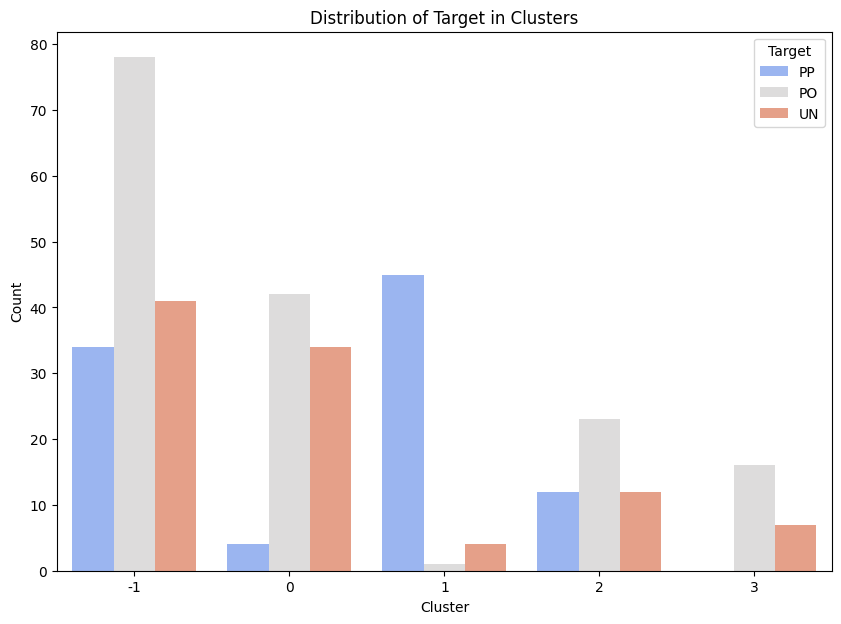

In [396]:
plot_cluster_distribution(df_tweet_red3, clusters2, target)